# UNIT14 numpy를 활용한 나만의 프로젝트 만들기

'우리 동네 인구 구조와 가장 비슷한 곳을 찾는' 간단한 프로젝트를 만들것이다.

In [1]:
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm 
fm._rebuild()

[(f.name, f.fname) for f in fm.fontManager.ttflist if 'Nanum' in f.name]

[('NanumSquareRound',
  '/home/aiffel-dj10/anaconda3/envs/aiffel/lib/python3.7/site-packages/matplotlib/mpl-data/fonts/ttf/NanumSquareRoundR.ttf'),
 ('NanumSquare',
  '/home/aiffel-dj10/anaconda3/envs/aiffel/lib/python3.7/site-packages/matplotlib/mpl-data/fonts/ttf/NanumSquareB.ttf'),
 ('NanumBarunGothic',
  '/home/aiffel-dj10/anaconda3/envs/aiffel/lib/python3.7/site-packages/matplotlib/mpl-data/fonts/ttf/NanumBarunGothic.ttf'),
 ('NanumMyeongjo',
  '/home/aiffel-dj10/anaconda3/envs/aiffel/lib/python3.7/site-packages/matplotlib/mpl-data/fonts/ttf/NanumMyeongjoBold.ttf'),
 ('NanumSquareRound',
  '/home/aiffel-dj10/anaconda3/envs/aiffel/lib/python3.7/site-packages/matplotlib/mpl-data/fonts/ttf/NanumSquareRoundB.ttf'),
 ('NanumGothic',
  '/home/aiffel-dj10/anaconda3/envs/aiffel/lib/python3.7/site-packages/matplotlib/mpl-data/fonts/ttf/NanumGothic.ttf'),
 ('NanumSquare',
  '/home/aiffel-dj10/anaconda3/envs/aiffel/lib/python3.7/site-packages/matplotlib/mpl-data/fonts/ttf/NanumSquareR.ttf'),

## 1. 관심 있는 데이터 찾기
---
나만의 데이터 프로젝트를 시작하는 데는 다양한 절차가 있지만, 처음 시작하는 단계에서는 관심 있는 데이터를 찾는 것에서부터 시작하는 것이 좋다.

만약 다른 데이터를 찾는 것이 조금 어렵거나 번거롭다면 지금까지 실습한 기온, 인구, 대중교통 데이터에 색다른 질문을 던져서 진행해도 좋다.

## 2. 데이터 살펴보며 질문하기
---
데이터를 살펴볼 때는 엑셀과 같은 스프레드시트 프로그램을 활용해서 데이터를 구석구석 살펴보는 것이 좋다.

이 데이터를 살펴보며 다음과 같은 질문들을 떠올렸다.

* __전국에서 영유아들이 가장 많이 사는 지역은 어디일까?__
* __보통 학군이 좋다고 알려진 지역에는 청소년들이 많이 살까?__
* __광역시 데이터를 10년 단위로 살펴보면 청년 비율이 줄고 있다는 사실을 알 수 있을까?__
* __서울에서 지난 5년간 인구가 가장 많이 증가한 구는 어디일까?__
* __우리 동네의 인구 구조와 가장 비슷한 동네는 어디일까?__

## 3. 질문을 명확한 문제로 정의하기
---
* __전국에서 영유아들이 가장 많이 사는 지역은 어디일까?__
    - 전국에 있는 읍면동 중 만 0세 이상 6 세 이하의 인구 비율이 높은 상위 10 곳은 어디일까?
* __보통 학군이 좋다고 알려진 지역에는 청소년들이 많이 살까?__
    - 전국에 있는 읍면동 중 만 13세 이상 18세 이하의 인구 비율이 높은 상위 10 곳은 과연 학군이 좋은곳일까?
* __광역시 데이터를 10년 단위로 살펴보면 청년 비율이 줄고 있다는 사실을 알 수 있을까?__
    - 청년은 만 19세 이상 39세 이하의 인구로 설정
* __서울에서 지난 5년간 인구가 가장 많이 증가한 구는 어디일까?__
    - 서울 내 구의 5년간 인구 증감률을 보자.
* __우리 동네의 인구 구조와 가장 비슷한 동네는 어디일까?__
    - 전국에서 둔산동의 연령별 인구 구조와 가장 형태가 비슷한 지역은 어디일까?

## 4. 알고리즘 설계하기
---
1. 데이터를 읽어온다.
2. 궁금한 지역의 이름을 입력받는다.
3. 궁금한 지역의 인구 구조를 저장한다.
4. 궁금한 지역의 인구 구조와 가장 비슷한 인구 구조를 가진 지역을 찾는다.
5. 가장 비슷한 곳의 인구 구조와 궁금한 지역의 인구 구조를 시각화한다.

## 5. 알고리즘을 코드로 표현하기
---

### 데이터를 읽어온다.

In [2]:
import csv
f = open('age1.csv', encoding='cp949')

data = csv.reader(f)

for row in data :
    print(row)

['행정구역', '총인구수', '연령구간인구수', '0세', '1세', '2세', '3세', '4세', '5세', '6세', '7세', '8세', '9세', '10세', '11세', '12세', '13세', '14세', '15세', '16세', '17세', '18세', '19세', '20세', '21세', '22세', '23세', '24세', '25세', '26세', '27세', '28세', '29세', '30세', '31세', '32세', '33세', '34세', '35세', '36세', '37세', '38세', '39세', '40세', '41세', '42세', '43세', '44세', '45세', '46세', '47세', '48세', '49세', '50세', '51세', '52세', '53세', '54세', '55세', '56세', '57세', '58세', '59세', '60세', '61세', '62세', '63세', '64세', '65세', '66세', '67세', '68세', '69세', '70세', '71세', '72세', '73세', '74세', '75세', '76세', '77세', '78세', '79세', '80세', '81세', '82세', '83세', '84세', '85세', '86세', '87세', '88세', '89세', '90세', '91세', '92세', '93세', '94세', '95세', '96세', '97세', '98세', '99세', '100세 이상']
['서울특별시  (1100000000)', '9857426', '9857426', '61253', '70532', '74322', '72482', '71688', '78941', '75386', '75929', '71772', '76157', '80577', '74502', '72380', '80264', '83081', '83791', '93326', '108584', '105344', '112807', '120957', '125632', '134735', '143930', '1

['충청남도 천안시 동남구 목천읍(4413125000)', '26189', '26189', '168', '224', '260', '262', '242', '271', '267', '283', '319', '323', '341', '300', '316', '281', '318', '322', '404', '395', '379', '391', '337', '344', '305', '330', '265', '262', '262', '243', '220', '256', '246', '250', '263', '273', '336', '388', '429', '440', '465', '418', '491', '496', '494', '542', '614', '522', '560', '509', '511', '533', '464', '426', '442', '404', '356', '406', '418', '425', '348', '335', '317', '254', '271', '239', '225', '212', '169', '166', '164', '191', '182', '142', '132', '157', '149', '160', '134', '111', '140', '140', '110', '114', '102', '96', '85', '79', '42', '43', '34', '26', '22', '19', '17', '13', '13', '12', '8', '1', '3', '0', '1']
['충청남도 천안시 동남구 풍세면(4413131000)', '4323', '4323', '8', '19', '20', '16', '24', '14', '30', '18', '26', '26', '40', '23', '17', '26', '24', '34', '29', '29', '32', '35', '40', '38', '44', '38', '56', '48', '43', '37', '51', '42', '35', '38', '37', '35', '44', '38', '

그리고 데이터 처리에 불필요한 헤더 부분을 제외시키고자 `next()` 함수를 사용한다.

In [3]:
import csv
f = open('age1.csv', encoding='cp949')

data = csv.reader(f)

next(data) # 헤더 제거

for row in data :
    print(row)

['서울특별시  (1100000000)', '9857426', '9857426', '61253', '70532', '74322', '72482', '71688', '78941', '75386', '75929', '71772', '76157', '80577', '74502', '72380', '80264', '83081', '83791', '93326', '108584', '105344', '112807', '120957', '125632', '134735', '143930', '149420', '159845', '161550', '150999', '149562', '150485', '146573', '148015', '150838', '149335', '163855', '173092', '173138', '169187', '165335', '139821', '150481', '147416', '150031', '162292', '168414', '171738', '181275', '175113', '172711', '168518', '157576', '144996', '154444', '153733', '146916', '158349', '163134', '168880', '158018', '147497', '147029', '133804', '141178', '119297', '105263', '114400', '80233', '89224', '89871', '88753', '90591', '73185', '64285', '64933', '63515', '74898', '60021', '50860', '49861', '43160', '38593', '34377', '31713', '26206', '21753', '19206', '15377', '13515', '12208', '10165', '8200', '5892', '4695', '3589', '3501', '2569', '1851', '1436', '1010', '736', '5519']
['서울특별시 

['대구광역시 수성구 두산동(2726064000)', '14573', '14573', '84', '100', '128', '116', '108', '126', '135', '102', '104', '129', '115', '110', '87', '117', '122', '135', '139', '187', '197', '192', '225', '204', '253', '234', '260', '263', '207', '186', '187', '171', '198', '175', '184', '174', '223', '247', '221', '229', '244', '229', '199', '208', '203', '247', '257', '242', '262', '311', '291', '310', '305', '282', '275', '299', '253', '258', '246', '236', '279', '221', '198', '207', '200', '145', '141', '163', '117', '116', '111', '94', '112', '70', '63', '68', '94', '79', '68', '57', '57', '54', '47', '47', '31', '41', '28', '31', '24', '12', '16', '12', '6', '5', '11', '5', '1', '3', '2', '1', '1', '1', '3']
['대구광역시 수성구 지산1동(2726065100)', '23988', '23988', '92', '115', '137', '132', '134', '137', '123', '117', '142', '150', '176', '190', '162', '200', '231', '266', '300', '344', '375', '351', '404', '384', '409', '399', '346', '367', '354', '304', '311', '254', '223', '235', '226', '234', '2

['전라북도 전주시 완산구 삼천3동(4511170300)', '24541', '24541', '132', '148', '199', '191', '219', '217', '244', '231', '225', '241', '268', '240', '272', '294', '323', '321', '386', '446', '414', '465', '415', '434', '453', '392', '347', '336', '289', '276', '241', '235', '205', '209', '204', '216', '286', '308', '277', '336', '292', '300', '342', '342', '373', '441', '431', '452', '510', '489', '445', '537', '469', '488', '476', '420', '399', '461', '443', '459', '384', '338', '328', '276', '298', '255', '208', '198', '170', '196', '175', '168', '182', '123', '105', '99', '114', '169', '139', '101', '103', '103', '97', '95', '96', '84', '81', '71', '54', '38', '40', '42', '26', '20', '10', '12', '10', '10', '7', '7', '3', '1', '1']
['전라북도 전주시 완산구 효자1동(4511171100)', '13283', '13283', '70', '99', '101', '101', '94', '99', '111', '101', '98', '118', '123', '87', '109', '103', '103', '111', '132', '159', '157', '171', '220', '194', '201', '208', '177', '180', '191', '153', '150', '143', '132', '133'

['경상북도 영덕군 병곡면(4777037000)', '2969', '2969', '8', '10', '8', '10', '13', '9', '7', '16', '7', '13', '15', '7', '14', '16', '18', '15', '14', '14', '19', '19', '19', '23', '21', '10', '9', '20', '12', '12', '6', '12', '11', '8', '15', '16', '17', '18', '20', '26', '17', '17', '18', '22', '22', '18', '26', '29', '37', '23', '36', '45', '33', '45', '38', '38', '35', '56', '65', '62', '72', '58', '65', '57', '57', '47', '65', '80', '48', '38', '67', '54', '48', '54', '52', '57', '71', '71', '61', '74', '88', '70', '51', '56', '55', '36', '38', '32', '35', '31', '23', '13', '9', '4', '8', '6', '5', '1', '0', '1', '0', '0', '2']
['경상북도 영덕군 창수면(4777038000)', '1810', '1810', '5', '1', '2', '5', '3', '3', '4', '3', '3', '5', '6', '7', '5', '5', '5', '9', '6', '13', '5', '11', '5', '10', '8', '10', '12', '9', '11', '0', '7', '5', '7', '7', '5', '14', '8', '9', '8', '7', '7', '5', '10', '13', '10', '6', '18', '15', '17', '12', '23', '27', '21', '20', '12', '24', '27', '36', '29', '41', '33', '32'

### 궁금한 지역의 이름을 입력받는다.

```python
name = input('인구 구조가 알고 싶은 지역의 이름(읍면동 단위)을 입력해주세요 : ')
```

### 궁금한 지역의 인구 구조를 저장한다.

In [4]:
import csv
f = open('age1.csv', encoding='cp949')
data = csv.reader(f)
next(data) # 헤더 제거

home = []  #입력 받은 지역의 데이터를 저장할 리스트 생성

name = input('인구 구조가 알고 싶은 지역의 이름(읍면동 단위)을 입력해주세요 : ')
for row in data :
    if name in row[0] : #입력 받은 지역의 이름이 포함된 행 찾기
        for i in row[3:] : #3번 인덱스 값부터 슬라이싱
            home.append(int(i)) #입력 받은 지역의 데이터를 home에 저장
print(home) #home에 저장된 데이터 출력

인구 구조가 알고 싶은 지역의 이름(읍면동 단위)을 입력해주세요 : 둔산2동
[289, 364, 357, 363, 367, 411, 416, 428, 410, 411, 447, 409, 475, 504, 544, 518, 607, 751, 666, 648, 694, 610, 602, 655, 518, 571, 529, 490, 496, 485, 461, 473, 484, 504, 576, 587, 637, 621, 625, 570, 579, 607, 673, 682, 819, 801, 923, 865, 838, 861, 753, 643, 674, 639, 550, 625, 635, 591, 505, 418, 426, 393, 374, 278, 224, 226, 170, 172, 144, 124, 123, 103, 95, 103, 98, 119, 102, 93, 107, 67, 65, 77, 50, 58, 52, 48, 36, 26, 19, 27, 16, 11, 9, 10, 4, 6, 1, 2, 3, 2, 2]


여기서 9, 10행은 숫자 데이터를 한꺼번에 처리하는 부분으로 `for` 반복문을 사용하여 `row`의 3번 인덱스 값부터 끝 번 인덱스 값까지 저장한다.

```python
for i in row[3:] : #3번 인덱스 값부터 슬라이싱
    home.append(int(i)) #입력 받은 지역의 데이터를 home에 저장
```

숫자를 다루는 유용한 라이브러리인 `numpy`를 사용하여 수정하겠다.

In [5]:
import numpy as np
import csv
f = open('age1.csv', encoding='cp949')
data = csv.reader(f)
next(data) # 헤더 제거

name = input('인구 구조가 알고 싶은 지역의 이름(읍면동 단위)을 입력해주세요 : ')
for row in data :
    if name in row[0] :
        home = np.array(row[3:], dtype = int) 
        
print(home) #home에 저장된 데이터 출력

인구 구조가 알고 싶은 지역의 이름(읍면동 단위)을 입력해주세요 : 둔산2동
[289 364 357 363 367 411 416 428 410 411 447 409 475 504 544 518 607 751
 666 648 694 610 602 655 518 571 529 490 496 485 461 473 484 504 576 587
 637 621 625 570 579 607 673 682 819 801 923 865 838 861 753 643 674 639
 550 625 635 591 505 418 426 393 374 278 224 226 170 172 144 124 123 103
  95 103  98 119 102  93 107  67  65  77  50  58  52  48  36  26  19  27
  16  11   9  10   4   6   1   2   3   2   2]


9행의 `dtype = int`는 리스트를 `numpy` 배열로 저장할 때 데이터 타입을 정수로 변환하라는 옵션이다. 여기까지 잘 작성이 되었는지 중간 점검을 위해 그래프로 표현해보자.

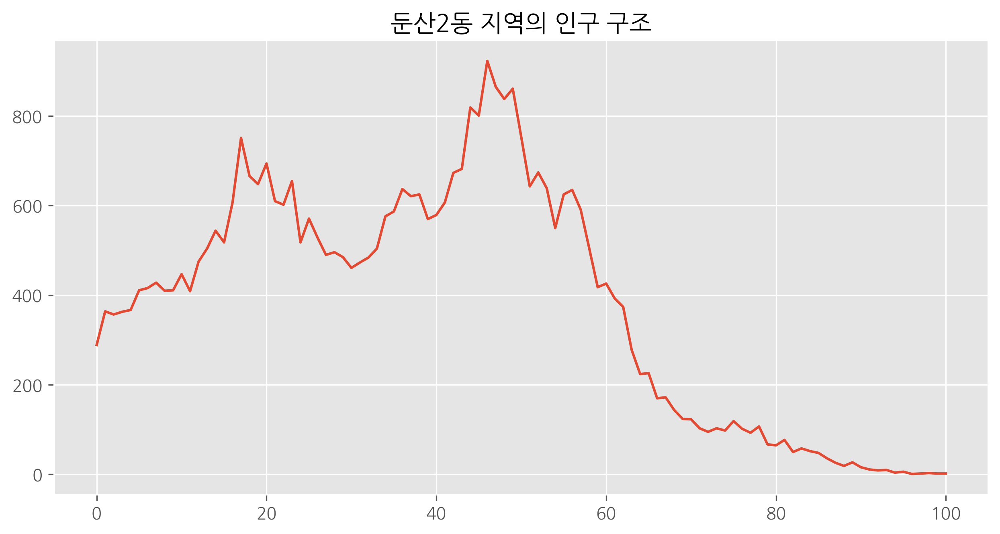

In [6]:
plt.style.use('ggplot')
plt.figure(figsize = (10,5), dpi=300)    
plt.rc('font', family ='NanumGothic')
plt.title(name +' 지역의 인구 구조')

plt.plot(home) 
plt.show()

### 궁금한 지역의 인구 구조와 가장 비슷한 인구 구조를 가진 지역 찾기
특정 지역의 인구 구조와 가장 비슷한 인구 구조를 가진 지역을 어떻게 찾을 수 있을까?

만약 궁금한 지역을 `A`, 비교할 지역을 `B`라고 하면 `A`의 0세 인구수와 `B`의 0세 인구수의 차이, `A`의 1세 인구수와 `B`의 1세 인구수의 차이, 이런 식으로 `A`의 100세 이상 인구수와 `B`의 100세 이상 인구수의 차이를 모두 더했을 때 그 차이가 가장 작은 지역을 찾으면 어떨까?

이것을 다시 알고리즘으로 표현하면 다음과 같다.

1. 전국의 모든 지역 중 한 곳(B)을 선택한다.
2. 궁금한 지역 A의 0세 인구 비율에서 B의 0세 인구 비율을 뺀다.
3. 2를 100세 이상 인구수에 해당하는 값까지 반복한 후 각각의 차이를 모두 더한다.
4. 전국의 모든 지역에 대해 반복하며 그 차이가 가장 작은 지역을 찾는다.

인구 구조가 알고 싶은 지역의 이름(읍면동 단위)을 입력해주세요 : 둔산2동


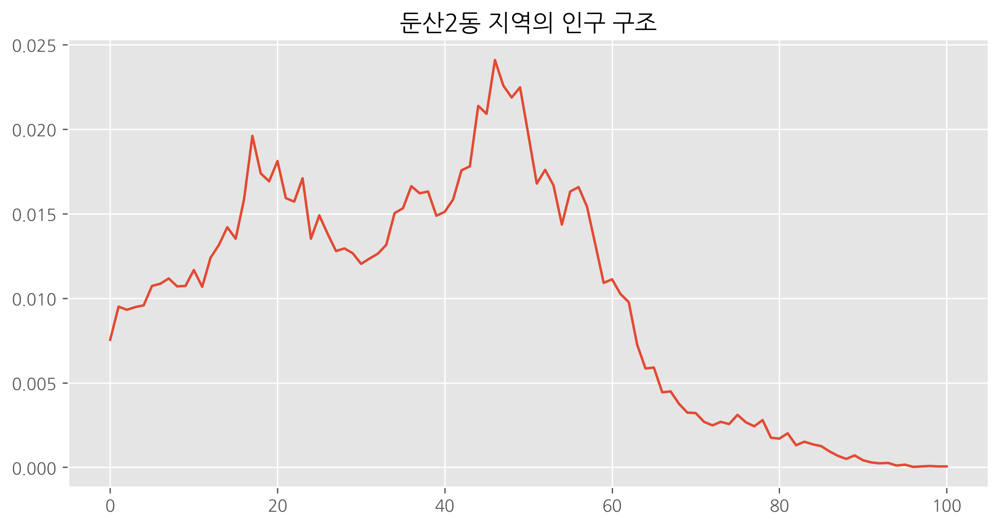

In [7]:
f = open('age1.csv', encoding='cp949')
data = csv.reader(f)
next(data) # 헤더 제거

data = list(data)
name = input('인구 구조가 알고 싶은 지역의 이름(읍면동 단위)을 입력해주세요 : ')
for row in data :
    if name in row[0] :
        home = np.array(row[3:], dtype =int) / int(row[2].replace(',', ''))  #수정
        
plt.style.use('ggplot')
plt.figure(figsize = (10,5), dpi=300)    
plt.rc('font', family ='NanumGothic')
plt.title(name +' 지역의 인구 구조')

plt.plot(home) 
plt.show()

In [8]:
f = open('age1.csv', encoding='cp949')

data = csv.reader(f)
next(data)

data = list(data)  #추가
name = input('인구 구조가 알고 싶은 지역의 이름(읍면동 단위)을 입력해주세요 : ')

for row in data : # 인구 데이터를 처음부터 마지막 줄까지 한 줄씩 아래로 읽는다
    if name in row[0] :
        home = np.array(row[3:], dtype =int) / int(row[2].replace(',', '')) 
for row in data :
    print(row) 

인구 구조가 알고 싶은 지역의 이름(읍면동 단위)을 입력해주세요 : 둔산2동
['서울특별시  (1100000000)', '9857426', '9857426', '61253', '70532', '74322', '72482', '71688', '78941', '75386', '75929', '71772', '76157', '80577', '74502', '72380', '80264', '83081', '83791', '93326', '108584', '105344', '112807', '120957', '125632', '134735', '143930', '149420', '159845', '161550', '150999', '149562', '150485', '146573', '148015', '150838', '149335', '163855', '173092', '173138', '169187', '165335', '139821', '150481', '147416', '150031', '162292', '168414', '171738', '181275', '175113', '172711', '168518', '157576', '144996', '154444', '153733', '146916', '158349', '163134', '168880', '158018', '147497', '147029', '133804', '141178', '119297', '105263', '114400', '80233', '89224', '89871', '88753', '90591', '73185', '64285', '64933', '63515', '74898', '60021', '50860', '49861', '43160', '38593', '34377', '31713', '26206', '21753', '19206', '15377', '13515', '12208', '10165', '8200', '5892', '4695', '3589', '3501', '2569', '185

['경상북도 포항시 북구 두호동(4711369000)', '22659', '22659', '112', '130', '151', '147', '170', '192', '194', '216', '179', '191', '238', '206', '212', '251', '263', '249', '353', '384', '360', '369', '348', '368', '362', '346', '304', '286', '286', '239', '231', '192', '221', '216', '209', '220', '240', '255', '298', '286', '286', '221', '280', '279', '282', '346', '367', '342', '450', '466', '446', '461', '413', '440', '486', '467', '426', '467', '498', '491', '471', '419', '427', '362', '357', '331', '278', '284', '187', '190', '196', '180', '190', '114', '100', '107', '128', '122', '95', '96', '84', '65', '73', '59', '65', '51', '36', '50', '40', '25', '15', '22', '20', '7', '5', '3', '4', '5', '0', '2', '3', '1', '2']
['경상북도 포항시 북구 장량동(4711370000)', '74226', '74226', '708', '926', '1027', '1053', '1027', '1114', '1086', '996', '930', '915', '982', '853', '877', '832', '906', '838', '937', '1116', '1061', '994', '981', '1028', '1041', '942', '899', '927', '823', '761', '804', '752', '809', '8

#### 전국의 모든 지역 중 한 곳(B)을 선택한다. &  궁금한 지역 A의 0세 인구 비율에서 B의 0세 인구 비율을 뺀다.

In [11]:
f = open('age1.csv', encoding='cp949')

data = csv.reader(f)
next(data)

data = list(data)  #추가
name = input('인구 구조가 알고 싶은 지역의 이름(읍면동 단위)을 입력해주세요 : ')

for row in data : 
    if name in row[0] :
        home = np.array(row[3:], dtype = int) / int(row[2].replace(',', '')) # 사용자로부터 입력받은 지역의 연령대별 인구 비율을 home에 저장한다
for row in data : 
    away = np.array(row[3:], dtype = int) / int(row[2].replace(',', '')) # 다른 동네의 인구 비율을 away에 저장한다
    print(home - away) # home에 저장된 인구 비율과 away에 저장된 값의 차를 출력하는 것을 의미한다.

인구 구조가 알고 싶은 지역의 이름(읍면동 단위)을 입력해주세요 : 둔산2동
[ 1.32805650e-03  2.34398929e-03  1.77683058e-03  2.12007217e-03
  2.30500744e-03  2.71747242e-03  3.20859780e-03  3.46667300e-03
  3.41864467e-03  2.99989909e-03  3.49098789e-03  3.11559939e-03
  5.05325172e-03  5.01025332e-03  5.76834750e-03  5.01780601e-03
  6.37312254e-03  8.58318083e-03  6.69364632e-03  5.46681126e-03
  5.84047228e-03  3.17408653e-03  2.04184659e-03  2.49217316e-03
 -1.64001724e-03 -1.31446969e-03 -2.58349775e-03 -2.53090905e-03
 -2.22855034e-03 -2.60924919e-03 -2.83871217e-03 -2.67183725e-03
 -2.67115647e-03 -1.99674830e-03 -1.59078603e-03 -2.24078221e-03
 -9.40613024e-04 -9.57345881e-04 -4.62187639e-04  6.90795531e-04
 -1.55752251e-04  8.85888850e-04  2.34298977e-03  1.33402636e-03
  4.28822161e-03  3.48127305e-03  5.69757826e-03  4.80908130e-03
  4.34814417e-03  5.37373320e-03  3.66531412e-03  2.07087076e-03
  1.92140369e-03  1.08014705e-03 -5.50900691e-04  2.46516641e-04
  2.20629462e-05 -1.70910328e-03 -2.85151034e-0

 -1.22657895e-03]
[ 8.03405994e-04  2.49981269e-03  2.66493154e-03  1.95202221e-03
  2.75200076e-03  2.37864938e-03  4.85675489e-03  4.43084930e-03
  4.74364909e-03  4.33500100e-03  4.49194207e-03  4.19585861e-03
  6.48341001e-03  5.45776102e-03  6.80595096e-03  5.12752334e-03
  7.23275852e-03  9.38212962e-03  5.12060831e-03  5.56383154e-03
  6.41648456e-03  3.48529438e-03  2.66787794e-03  2.39897355e-03
  2.58381525e-04  1.03286466e-03 -4.97942148e-04 -2.54954076e-04
  9.01539261e-04  4.84051961e-04 -9.87947046e-05 -3.07327897e-04
 -1.71576878e-03 -4.54768321e-04  1.19960703e-04 -1.81017394e-03
  1.46778986e-04 -1.48805390e-03 -1.16629464e-03  1.91973204e-03
  1.15468942e-03  2.05929534e-03  5.04243843e-03  2.53841659e-03
  5.20070237e-03  5.03528288e-03  7.43654139e-03  6.00988091e-03
  4.26188209e-03  6.25328990e-03  3.17399786e-03  2.04233849e-03
  1.11235742e-03 -6.27042714e-04 -1.64541588e-03 -1.55756496e-03
 -2.86167912e-03 -4.31425591e-03 -5.03696654e-03 -6.82916141e-03
 -5.663

 -4.58705754e-04]
[ 1.77928511e-03  2.74381063e-03  2.28672099e-03  2.54822376e-03
  2.98082965e-03  3.31660846e-03  3.82911747e-03  4.29562628e-03
  4.29400109e-03  4.14253669e-03  4.61928337e-03  4.39165909e-03
  6.42880968e-03  6.41349257e-03  7.08609699e-03  6.20042778e-03
  7.24782370e-03  9.99957092e-03  7.86744043e-03  6.50451334e-03
  6.73375670e-03  3.21799527e-03  1.62101645e-03  2.14054961e-03
 -2.18529953e-03 -1.13577334e-03 -2.19955151e-03 -1.27760268e-03
 -1.22325455e-03 -8.45809383e-04 -1.14122117e-03 -5.64409245e-04
 -7.26628819e-04  1.85401864e-04  2.40328369e-04 -4.84168077e-04
  9.30970763e-04  2.68604216e-04  1.19891930e-03  1.77595934e-03
  1.69875265e-03  2.70925393e-03  4.07382453e-03  2.73216746e-03
  5.70478567e-03  4.91489673e-03  7.89692190e-03  6.65503477e-03
  5.87240421e-03  5.95608721e-03  3.95549932e-03  1.87850512e-03
  1.83736216e-03  1.20915107e-03 -9.14372839e-04 -1.35419434e-03
 -2.57021285e-03 -4.16506140e-03 -5.26599286e-03 -6.24774375e-03
 -6.660

[-4.37473289e-03 -4.65394369e-03 -4.63634030e-03 -3.94567897e-03
 -3.84129211e-03 -1.92529517e-03 -1.26073055e-03  5.38319868e-05
  5.52113025e-04  1.11229079e-03  2.15191270e-03  2.42868004e-03
  4.65176417e-03  5.94264994e-03  5.98511655e-03  6.30800394e-03
  7.62920956e-03  9.55123284e-03  7.86709316e-03  6.79651112e-03
  6.32795672e-03  4.87019414e-03  3.92705899e-03  4.94300413e-03
  1.70155491e-03  4.38650333e-03  2.28903936e-03  1.97224887e-03
  1.39446772e-03  5.39942746e-04 -8.87499970e-04 -4.04586620e-03
 -3.15796116e-03 -2.90306740e-03 -4.22859024e-03 -8.18079469e-03
 -8.77862270e-03 -4.62310117e-03 -4.08477346e-03 -2.18208621e-03
 -3.14889814e-03  1.52074905e-04  2.40853910e-03  8.07505936e-04
  4.81669666e-03  3.97977508e-03  6.79639352e-03  6.81826710e-03
  4.84521332e-03  5.11163710e-03  3.46149423e-03  1.79253800e-03
  2.40125575e-03  2.05533186e-03 -6.34456443e-04 -8.13527048e-04
 -4.52419708e-04 -9.66453899e-04 -3.01049095e-03 -3.21134105e-03
 -3.46988825e-03 -2.76221

 -4.21639971e-05]
[ 2.67319518e-03  4.84213377e-03  1.69586659e-03  3.33424197e-03
  1.74514872e-03  9.88239044e-04  3.02388773e-03  3.76041833e-03
  6.04258263e-03  2.68171915e-03  4.25625590e-03  1.99447068e-03
  6.46875900e-03  7.22556371e-03  6.36426718e-03  5.89743761e-03
  5.67982505e-03  8.16764185e-03  8.48964127e-03  5.47968026e-03
  6.89181414e-03  2.54304859e-04 -1.64794896e-03 -5.13357839e-03
 -3.84007297e-03 -6.69064736e-03  6.80691143e-04 -4.14741095e-03
 -1.02724048e-03  1.22591581e-03 -3.54603747e-05  3.45297539e-03
  5.64764057e-04  1.93343840e-03  1.48386670e-03  2.19430058e-03
  3.23861110e-04  3.29327388e-03  4.03271578e-03 -2.27135881e-03
 -1.18974833e-03  1.65780980e-03  5.70872810e-03  1.92158328e-03
  5.70851817e-03  4.81540729e-03  1.03277416e-02  6.48559701e-03
  8.53289089e-03  6.59289517e-03  5.67961512e-03  3.23234656e-03
  3.82965970e-03  2.91627469e-03 -2.53072943e-04  1.91586565e-03
  3.87031290e-03  6.05207335e-04 -3.75596023e-03 -6.66142943e-03
 -1.583

 -1.05138226e-04]
[ 1.86658157e-03  4.58055100e-03  3.38891953e-03  4.93281222e-03
  3.64988668e-03  4.29366488e-03  6.06369946e-03  4.61118971e-03
  6.28547710e-03  3.03247179e-03  6.62045899e-03  5.88102246e-03
  6.72057045e-03  7.22513655e-03  8.14288582e-03  7.08601332e-03
  8.65190505e-03  1.12747581e-02  8.04758295e-03  9.09127380e-03
  9.28276819e-03  7.72124072e-03  4.73784221e-03  4.60753637e-03
  4.31138852e-03  5.23622725e-04  8.14873117e-04 -4.55137363e-04
 -2.98557077e-04  8.01691462e-04  6.79847551e-04  1.74972398e-03
  1.91066853e-03  3.44155729e-03  6.20335589e-03  2.95907910e-03
  4.39003413e-03  4.85532186e-03  4.20299286e-03  2.51543495e-03
  2.87642469e-03  4.74220647e-03  6.21235101e-03  5.18602835e-03
  7.87844306e-03  8.03929875e-03  7.43951864e-03  8.95277262e-03
  6.98696824e-03  6.95659613e-03  6.91277577e-03  1.39363169e-03
  2.83322638e-03  1.03700622e-03  1.11066550e-03 -1.72461465e-03
 -6.88677779e-03 -8.28727184e-03 -7.75696449e-03 -7.88335039e-03
 -7.170

 -1.58393223e-03]
[ 2.39489164e-03  3.24920405e-03  4.72093881e-03  4.69369557e-03
  4.98190596e-03  5.76251433e-03  7.91505673e-03  4.73557024e-03
  5.00112350e-03  4.10810257e-03  6.33434899e-03  6.44561502e-03
  7.98417465e-03  9.66009701e-03  8.49808323e-03  8.55486278e-03
  9.03923507e-03  1.13265737e-02  1.02112942e-02  7.71949448e-03
  9.10376687e-03  7.83076050e-03  2.29110444e-03  4.77717148e-03
  1.93721572e-03  3.68798864e-03  1.67280899e-03  4.69915477e-03
  3.38514682e-03  1.81131826e-03  4.67764417e-03  1.86580475e-03
  1.41757449e-03  3.22627348e-03  4.18611927e-03  3.00259490e-03
  3.75596003e-03  7.01488319e-03  6.93544651e-03  6.60306840e-03
  6.10264471e-03  5.54658801e-03  4.87926528e-03  4.93031218e-03
  7.21879735e-03  3.25640943e-03  9.19756153e-03  4.00748151e-03
  1.46463492e-03  4.27074171e-03  2.37141420e-03 -2.15363616e-03
  6.77420816e-04 -3.54478772e-03 -2.55857177e-03 -2.07190643e-03
 -6.22270399e-03 -5.71654766e-03 -9.43145333e-03 -1.07827498e-02
 -9.654

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



#### 2를 100세 이상 인구수에 해당하는 값까지 반복한 후 각각의 차이를 모두 더한다.

값을 더할 때 `for` 반복문을 사용할 수도 있지만, 이제 그 정도 코드는 쉽게 작성할 수 있기 때문에 `numpy`의 `sum()` 함수를 사용하겠다. 출력 부분 코드를 조금 수정하면 합계가 출력된다.
```python
print(np.sum(home - away))
```

In [12]:
f = open('age1.csv', encoding='cp949')

data = csv.reader(f)
next(data)

data = list(data)  #추가
name = input('인구 구조가 알고 싶은 지역의 이름(읍면동 단위)을 입력해주세요 : ')

for row in data : 
    if name in row[0] :
        home = np.array(row[3:], dtype = int) / int(row[2].replace(',', '')) # 사용자로부터 입력받은 지역의 연령대별 인구 비율을 home에 저장한다
for row in data : 
    away = np.array(row[3:], dtype = int) / int(row[2].replace(',', '')) # 다른 동네의 인구 비율을 away에 저장한다
    print(np.sum(home - away))

인구 구조가 알고 싶은 지역의 이름(읍면동 단위)을 입력해주세요 : 둔산2동
1.0842021724855044e-19
3.903127820947816e-18
-3.469446951953614e-18
-2.168404344971009e-18
8.673617379884035e-18
4.336808689942018e-19
1.6046192152785466e-17
4.336808689942018e-19
-4.7704895589362195e-18
7.37257477290143e-18
-1.214306433183765e-17
-1.0625181290357943e-17
-6.938893903907228e-18
8.673617379884035e-19
1.0842021724855044e-18
9.974659986866641e-18
-1.3010426069826053e-18
6.071532165918825e-18
-4.553649124439119e-18
8.673617379884035e-18
-1.0842021724855044e-18
-8.673617379884035e-19
-1.0408340855860843e-17
6.5052130349130266e-18
-6.884683795282953e-18
7.806255641895632e-18
-3.2959746043559335e-17
-1.1275702593849246e-17
1.0842021724855044e-18
-2.168404344971009e-19
-8.61940727125976e-18
5.5294310796760726e-18
2.0383000842727483e-17
0.0
7.37257477290143e-18
5.204170427930421e-18
-1.0842021724855044e-18
8.023096076392733e-18
1.1709383462843448e-17
0.0
-6.7220534694101275e-18
-8.023096076392733e-18
1.235990476633475e-17
6.505213034913

-1.1058862159352145e-17
-2.710505431213761e-18
8.673617379884035e-18
2.7647155398380363e-17
2.213127684586036e-17
7.318364664277155e-18
2.973424458041496e-17
3.220080452281948e-17
-2.862293735361732e-17
7.589415207398531e-18
3.3068166260807885e-18
-1.0842021724855044e-19
-3.71881345162528e-17
-2.1467203015212988e-17
6.06069014419397e-17
-3.686287386450715e-18
-1.5178830414797062e-17
3.63207727782644e-18
-4.336808689942018e-18
-8.782037597132586e-18
3.415236843329339e-18
1.973247953923618e-17
8.239936510889834e-18
2.6020852139652106e-17
7.128629284092192e-18
-2.3093506273941244e-17
-1.0191500421363742e-17
1.49890950346121e-17
5.366800753803247e-18
1.2739375526704677e-18
3.3610267347050637e-18
1.6263032587282567e-19
-2.303929616531697e-18
1.0842021724855044e-18
4.6349642873755315e-18
1.0842021724855044e-17
-1.349831704744453e-17
-5.922454367202068e-18
-1.5395670849294163e-17
8.72782748850831e-18
5.421010862427522e-19
-1.7211709488207383e-18
-2.3418766925686896e-17
-1.3552527156068805e-18

#### 전국의 모든 지역에 대해 반복하며 그 차이가 가장 작은 지역을 찾는다. & 가장 비슷한 곳의 인구 구조와 궁금한 지역의 인구 구조를 시각화한다.

인구 구조가 알고 싶은 지역의 이름(읍면동 단위)을 입력해주세요 : 둔산2동


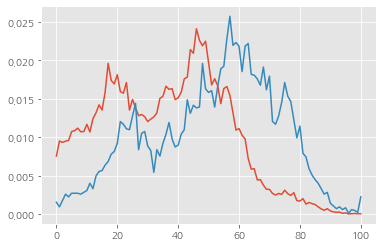

In [13]:
f = open('age1.csv', encoding='cp949')

data = csv.reader(f)
next(data)

data = list(data)  #추가
name = input('인구 구조가 알고 싶은 지역의 이름(읍면동 단위)을 입력해주세요 : ')

mn = 1 # 최솟값을 저장할 변수 생성 및 초기화
result_name = '' # 최솟값을 갖는 지역의 이름을 저장할 변수 생성 및 초기화
result = 0 # 최솟값을 갖는 지역의 연령대별 인구 비율을 저장할 배열 생성 및 초기화
for row in data :
    if name in row[0] :
        home = np.array(row[3:], dtype = int) / int(row[2]) # 사용자로부터 입력받은 지역의 인구 비율을 home에 저장한다.
    for row in data : # 과정을 전체 데이터에 대해 반복한다.
        away = np.array(row[3:], dtype = int) / int(row[2]) # 다른 지역의 인구 비율을 away에 저장한다.
        s = np.sum(home - away) # home에 저장된 값과 away에 저장된 값의 차이의 합을 계산한다.
        if s < mn : # if 조건문 안에서는 위에서 계산한 합이 최솟값인지 확인한다.
            mn = s # 만약 최솟값이라면 변수 mn의 값을 갱신한다.
            result_name = row[0]
            result = away
            
import matplotlib.pyplot as plt
plt.plot(home)
plt.plot(result)
plt.show()

빨간 그래프가 둔산동에 대한 그래프인데 파란색 그래프가 비슷한 인구 구조를 가진 지역이라니 믿기지 않는다. 그래도 그래프에 제목과 범례를 넣어서 다시 표현해보자.

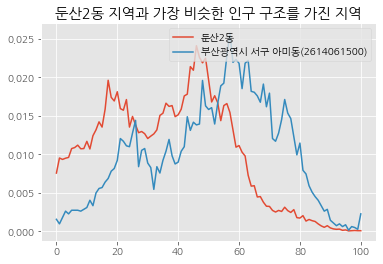

In [15]:
plt.rc('font', family ='NanumGothic')
plt.title(name +' 지역과 가장 비슷한 인구 구조를 가진 지역') # 그래프 제목 설정
plt.plot(home, label = name)  # home 값을 그리는 그래프 레이블 설정
plt.plot(result, label = result_name) # result 값을 그리는 그래프 레이블 설정
plt.legend() # 범례 표기 
plt.show()

우리가 찾는 것은 인구 구조가 가장 비슷한 지역이었다. 즉, 연령대별 인구 비율과 분포가 가장 비슷한 지역을 찾는 것이다. 즉, 두 지역의 차이를 합한 값이 0에 가까울수록 인구 구조가 비슷할 것이다. 그런데 지금 알고리즘에서는 음수(`-`) 값이 선택되어 이런 이상한 결과가 나온 것이다.

```python
if s < mn:
```

문제의 원인을 발견했으니 해결하는 것은 그렇게 어렵지 않다. 어떻게 해결하면 좋을까? 절댓값을 씌워도 좋고 제곱 값을 이용할 수도 있겠다. 여기에서는 거듭제곱 연산자를 활용해서 코드를 아주 간단하게 수정해보겠다.

```python
s = np.sum((home-away)**2)
```

not in 연산을 사용하여, 입력받은 이름과 같은 이름이 아닌 데이터 중에서 최솟값을 찾도록 한다.

```python
if s < mn and name not in row[0] :
```

In [16]:
import numpy as np
import csv
#1. 데이터를 읽어온다.
f = open('age1.csv', encoding='cp949')

data = csv.reader(f)
next(data)

data = list(data)  #추가
#2. 궁금한 지역의 이름을 입력받는다.
name = input('인구 구조가 알고 싶은 지역의 이름(읍면동 단위)을 입력해주세요 : ')
mn =1
result_name =''
result =0
#3. 궁금한 지역의 인구 구조를 저장한다.
for row in data :
    if name in row[0] :
        home = np.array(row[3:], dtype =int) /int(row[2])
#4. 궁금한 지역의 인구 구조와 가장 비슷한 인구 구조를 가진 지역을 찾는다.
for row in data :
    away = np.array(row[3:], dtype =int) /int(row[2])
    s = np.sum((home - away) **2)
    if s < mn and name not in row[0] :
        mn = s
        result_name = row[0]
        result = away

인구 구조가 알고 싶은 지역의 이름(읍면동 단위)을 입력해주세요 : 둔산2동


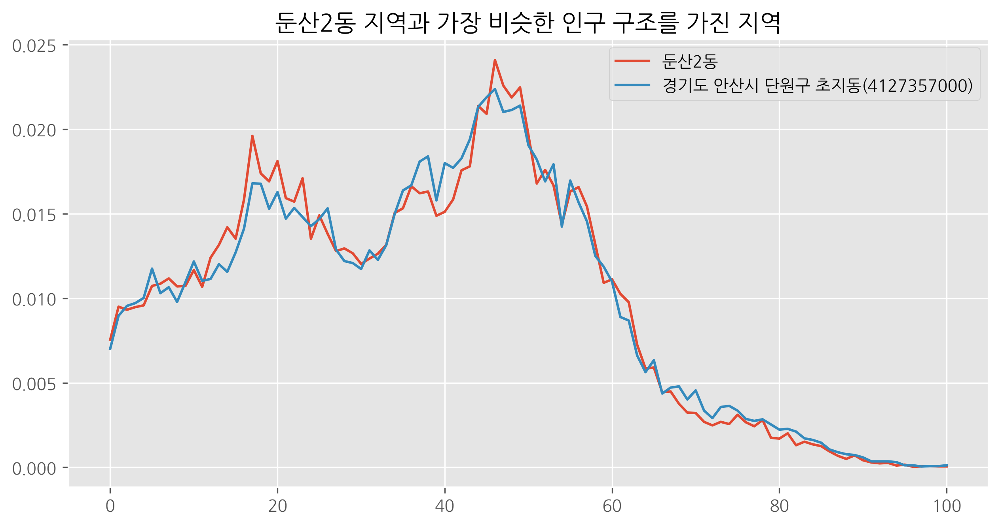

In [18]:
#5. 궁금한 지역의 인구 구조와 가장 비슷한 곳의 인구 구조를 시각화한다.
import matplotlib.pyplot as plt
plt.style.use('ggplot')
plt.figure(figsize = (10,5), dpi=300)            
plt.rc('font', family ='NanumGothic')
plt.title(name +' 지역과 가장 비슷한 인구 구조를 가진 지역')
plt.plot(home, label = name)
plt.plot(result, label = result_name)
plt.legend()
plt.show()